In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

In [29]:
from os import listdir
from os.path import isfile, join

image = 1
mypath = '../data/imagesprojets5/photo/'
onlyfiles = [f for f in listdir(mypath) if isfile(join(mypath, f))]

In [30]:
onlyfiles

['image_2_5.jpg',
 'image_2_4.jpg',
 'image_2_3.jpg',
 'image_2_2.jpg',
 'image_2_1.jpg',
 'image_1_2.jpg',
 'image_3_1.jpg',
 'image_1_3.jpg',
 'image_1_1.jpg']

In [31]:
img_file = onlyfiles[4]
origin_file = '../data/imagesprojets5/originals/image_1.jpg' 

In [32]:
img = cv2.imread(mypath + img_file)
origin = cv2.imread(origin_file)

In [33]:
img.shape

(2422, 1782, 3)

Text(0.5, 1.0, 'origin image')

<Figure size 720x720 with 0 Axes>

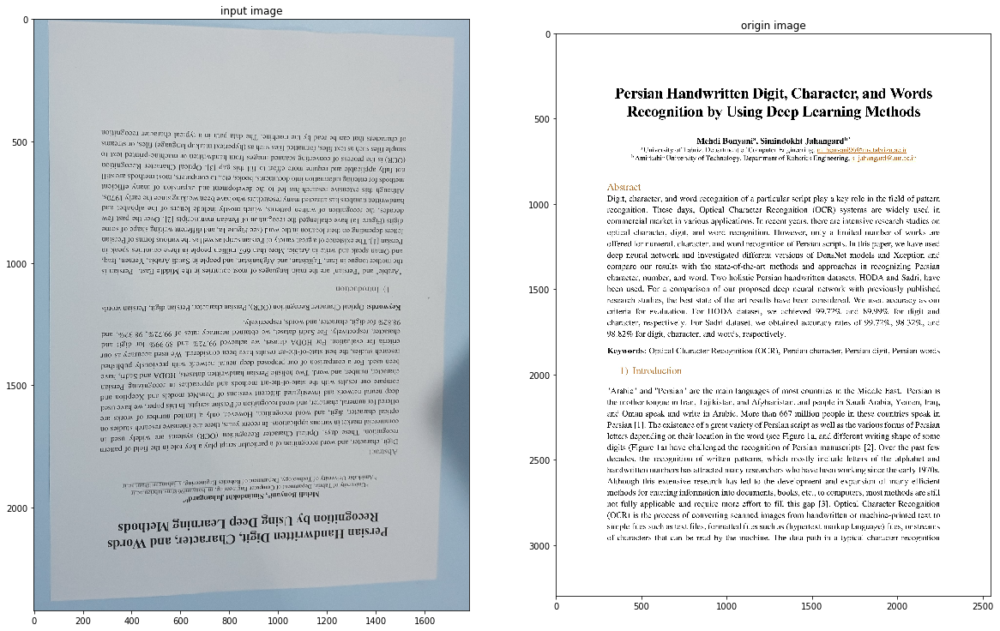

In [34]:
plt.figure(figsize=(10,10))
plt.rcParams["figure.figsize"] = [20,20]

fig, (ax1, ax2) = plt.subplots(1, 2)

ax1.imshow(img)
ax1.set_title('input image')
ax2.imshow(origin)
ax2.set_title('origin image')

In [35]:
rotate = True
angle = 180


if rotate or img.shape[1]>img.shape[0]:
    img = imutils.rotate_bound(img, angle)

Text(0.5, 1.0, 'origin image')

<Figure size 720x720 with 0 Axes>

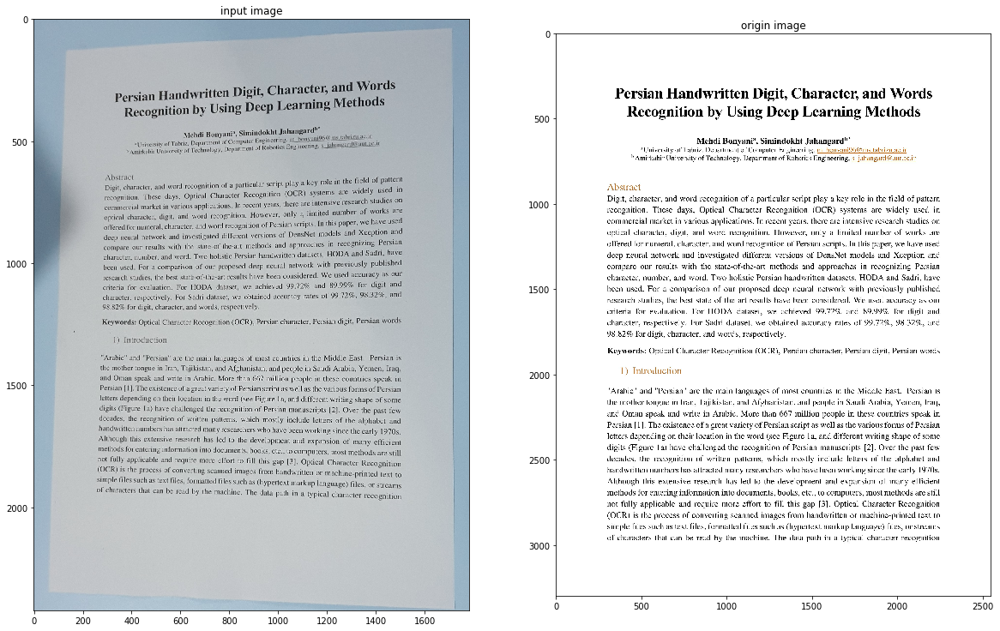

In [36]:
plt.figure(figsize=(10,10))
plt.rcParams["figure.figsize"] = [20,20]

fig, (ax1, ax2) = plt.subplots(1, 2)

ax1.imshow(img)
ax1.set_title('input image')
ax2.imshow(origin)
ax2.set_title('origin image')

In [ ]:
paper = img.copy()
    
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)


ret, thresh_gray = cv2.threshold(cv2.cvtColor(paper, cv2.COLOR_BGR2GRAY),
                        200, 255, cv2.THRESH_BINARY)

thresh_gray = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]


image, contours = cv2.findContours(thresh_gray, cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_NONE)
for c in contours:
    rect = cv2.minAreaRect(c)
    box = cv2.boxPoints(rect)
    # convert all coordinates floating point values to int
    box = np.int0(box)
    # draw a green 'nghien' rectangle
    cv2.drawContours(paper, [box], 0, (0, 255, 0),1)
plt.imshow(paper)



In [37]:

import imutils

image = img.copy()
ratio = image.shape[0] / 500.0
orig = image.copy()
image = imutils.resize(image, height = 500)
# convert the image to grayscale, blur it, and find edges
# in the image
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
gray = cv2.GaussianBlur(gray, (5, 5), 0)
edged = cv2.Canny(gray, 75, 200)


cnts = cv2.findContours(edged.copy(), cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
cnts = imutils.grab_contours(cnts)
cnts = sorted(cnts, key = cv2.contourArea, reverse = True)[:5]
# loop over the contours
for c in cnts:
    # approximate the contour
    peri = cv2.arcLength(c, True)
    approx = cv2.approxPolyDP(c, 0.02 * peri, True)
    # if our approximated contour has four points, then we
    # can assume that we have found our screen
    if len(approx) >= 4:
        screenCnt = approx
        break

cv2.drawContours(image, [screenCnt], -1, (0, 255, 0), 2)



array([[[ 93, 107, 118],
        [117, 134, 148],
        [116, 134, 148],
        ...,
        [103, 125, 141],
        [103, 125, 141],
        [103, 125, 141]],

       [[116, 133, 147],
        [147, 169, 187],
        [147, 169, 187],
        ...,
        [129, 156, 177],
        [129, 156, 177],
        [129, 156, 177]],

       [[116, 133, 148],
        [147, 169, 187],
        [146, 168, 186],
        ...,
        [130, 157, 178],
        [130, 157, 178],
        [130, 157, 178]],

       ...,

       [[131, 147, 161],
        [166, 186, 203],
        [167, 187, 204],
        ...,
        [154, 180, 197],
        [154, 180, 197],
        [154, 180, 197]],

       [[131, 147, 161],
        [166, 186, 203],
        [166, 186, 203],
        ...,
        [154, 180, 197],
        [154, 180, 197],
        [153, 179, 196]],

       [[133, 147, 161],
        [167, 186, 203],
        [166, 186, 203],
        ...,
        [154, 180, 197],
        [155, 181, 198],
        [154, 180, 197]]

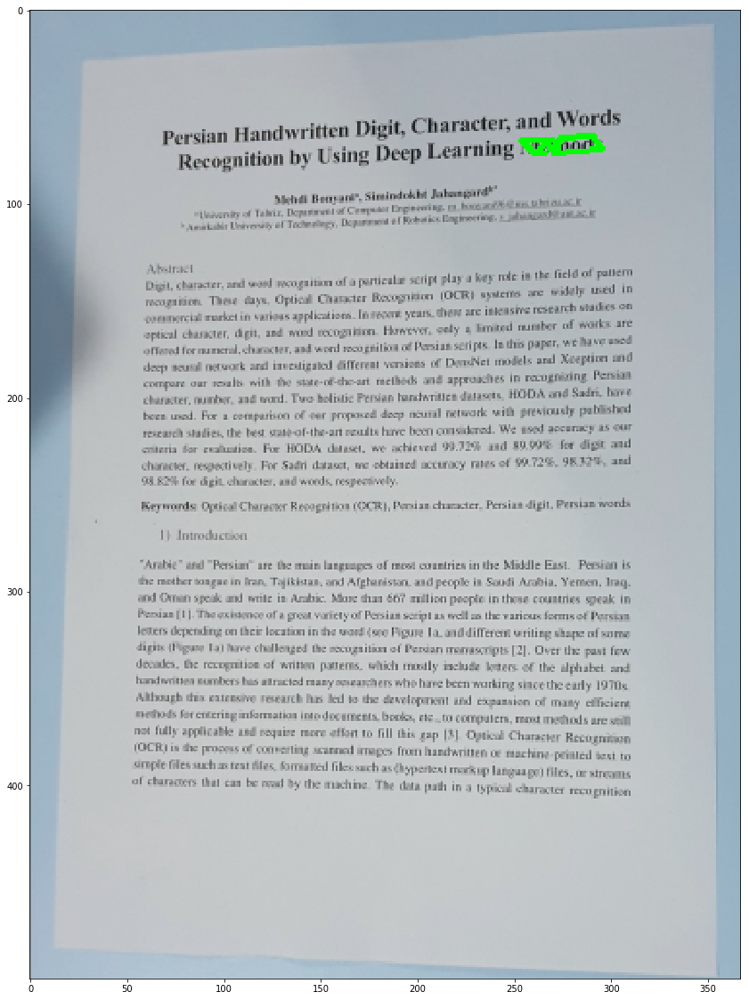

In [38]:
plt.imshow(image)

Remove Shadows

Text(0.5, 1.0, 'result_norm_planes')

<Figure size 720x720 with 0 Axes>

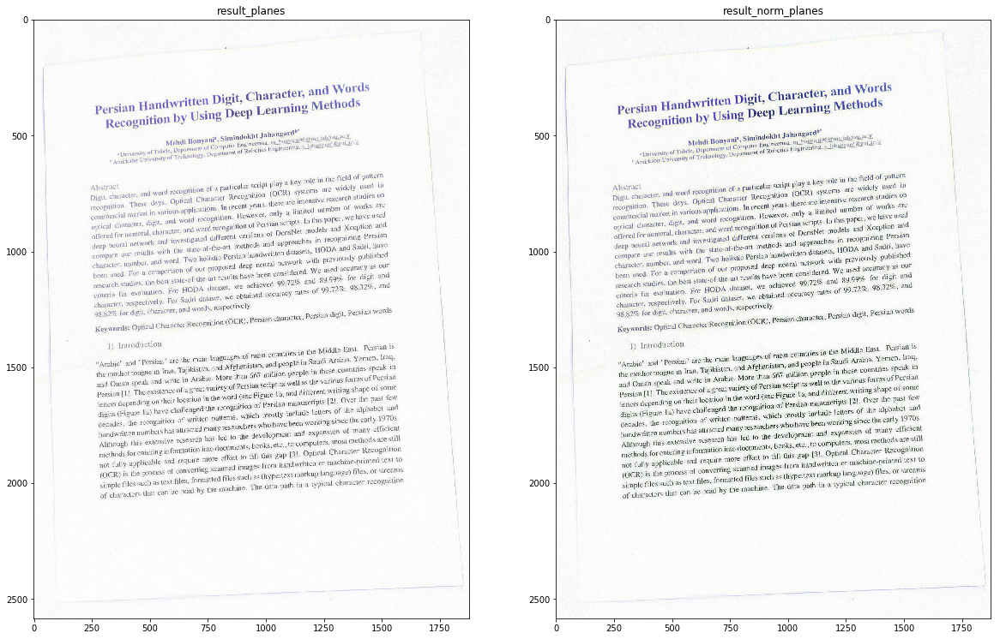

In [469]:

rgb_planes = cv2.split(img)

result_planes = []
result_norm_planes = []
for plane in rgb_planes:
    dilated_img = cv2.dilate(plane, np.ones((7,7), np.uint8))
    bg_img = cv2.medianBlur(dilated_img, 21)
    diff_img = 255 - cv2.absdiff(plane, bg_img)
    norm_img = cv2.normalize(diff_img,None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8UC1)
    result_planes.append(diff_img)
    result_norm_planes.append(norm_img)

result = cv2.merge(result_planes)
result_norm = cv2.merge(result_norm_planes)

plt.figure(figsize=(10,10))
plt.rcParams["figure.figsize"] = [20,20]

fig, (ax1, ax2) = plt.subplots(1, 2)

ax1.imshow(result)
ax1.set_title('result_planes')
ax2.imshow(result_norm)
ax2.set_title('result_norm_planes')

In [485]:
img = result_norm.copy()

In [486]:
import imutils

In [488]:
scale_percent = 40
width = int(img.shape[1]*scale_percent/100)
height = int(img.shape[0]*scale_percent/100)
dim = (width, height)

img = cv2.resize(img,dim, interpolation = cv2.INTER_AREA)
origin = cv2.resize(origin,dim, interpolation = cv2.INTER_AREA)

Text(0.5, 1.0, 'origin image')

<Figure size 720x720 with 0 Axes>

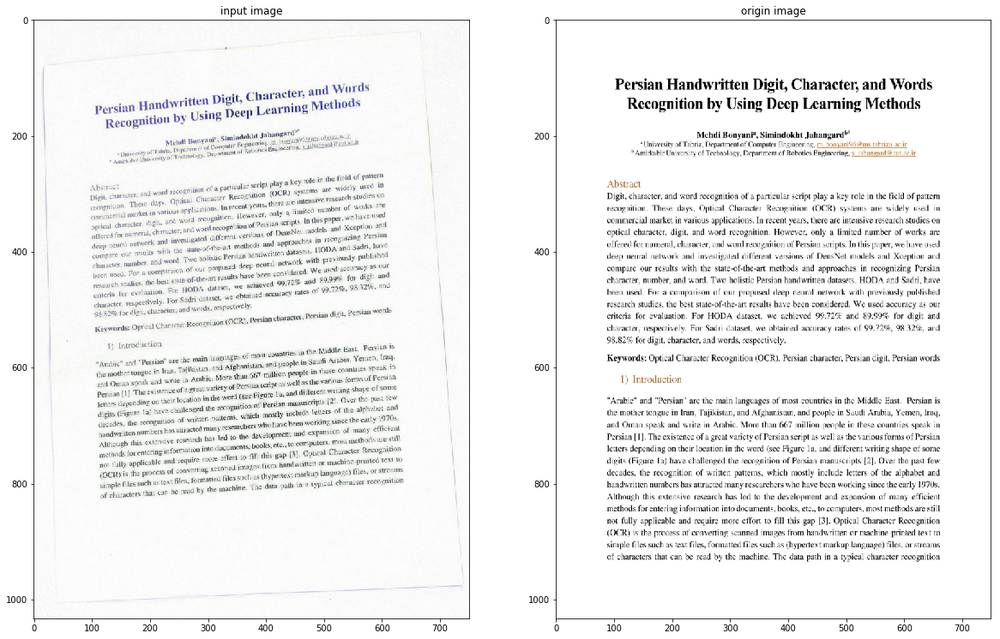

In [489]:
plt.figure(figsize=(10,10))
plt.rcParams["figure.figsize"] = [20,20]

fig, (ax1, ax2) = plt.subplots(1, 2)

ax1.imshow(img)
ax1.set_title('input image')
ax2.imshow(origin)
ax2.set_title('origin image')

In [490]:

## FIX
orb = cv2.ORB_create()

# find the keypoints with ORB
kp1 = orb.detect(img,None)

# compute the descriptors with ORB
kp1, des1 = orb.compute(img, kp1)

In [491]:
kp2 = orb.detect(origin,None)
kp2, des2 = orb.compute(origin, kp2)

In [492]:
# find the keypoints and descriptors with SIFT


In [493]:
# create BFMatcher object
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)

# Match descriptors.
matches = bf.match(des1,des2)


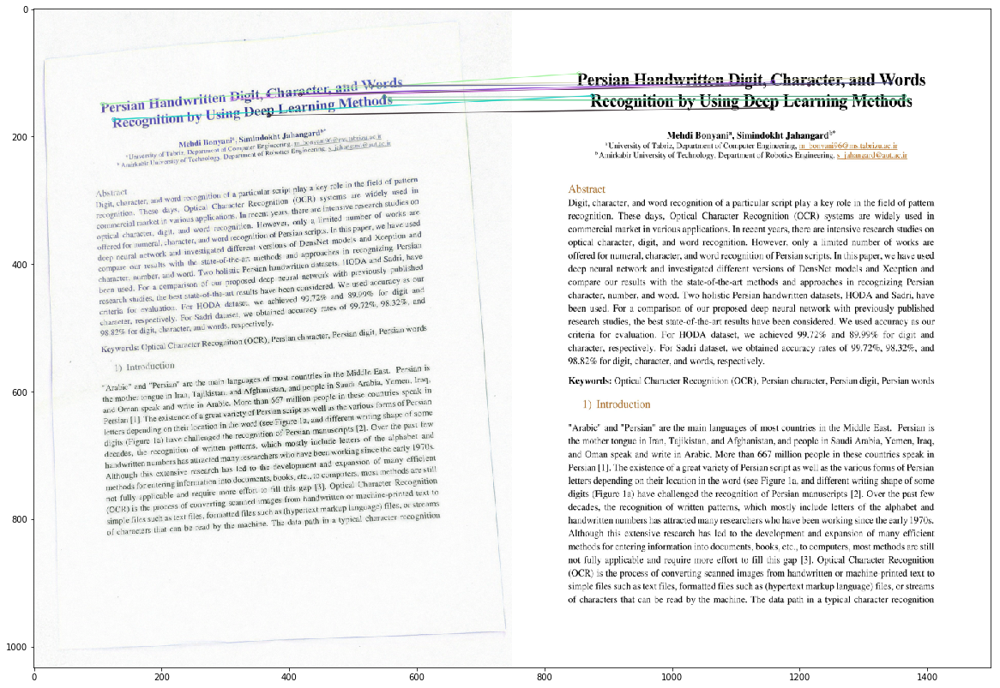

(<matplotlib.image.AxesImage at 0x199a4de80>, None)

In [494]:
# Sort them in the order of their distance.
matches = sorted(matches, key = lambda x:x.distance)

# Draw first 10 matches.
img3 = cv2.drawMatches(img,kp1,origin,kp2,matches[:10],None, flags=2)

plt.imshow(img3),plt.show()

In [495]:
src=[]
dest=[]
for match in matches[:100]:
    kp_img1=kp1[match.queryIdx]
    kp_img2=kp2[match.trainIdx]
    src.append((kp_img1.pt[0],kp_img1.pt[1]))
    dest.append((kp_img2.pt[0],kp_img2.pt[1])) 

In [496]:
h, status = cv2.findHomography(np.array(src), np.array(dest),cv2.RANSAC, 5.0)
print(h)

[[ 1.26031586e+00  1.97425984e-02 -2.85604660e+01]
 [ 1.29696191e-01  1.40181089e+00 -1.14774994e+02]
 [ 8.30893328e-05  3.02901578e-04  1.00000000e+00]]


In [497]:
height,width=origin.shape[:2]
img1=origin.copy()
img2=img.copy()
rows1, cols1 = img1.shape[:2]
rows2, cols2 = img2.shape[:2]


In [522]:
im_out = cv2.warpPerspective(img,h,(origin.shape[1], origin.shape[0]))

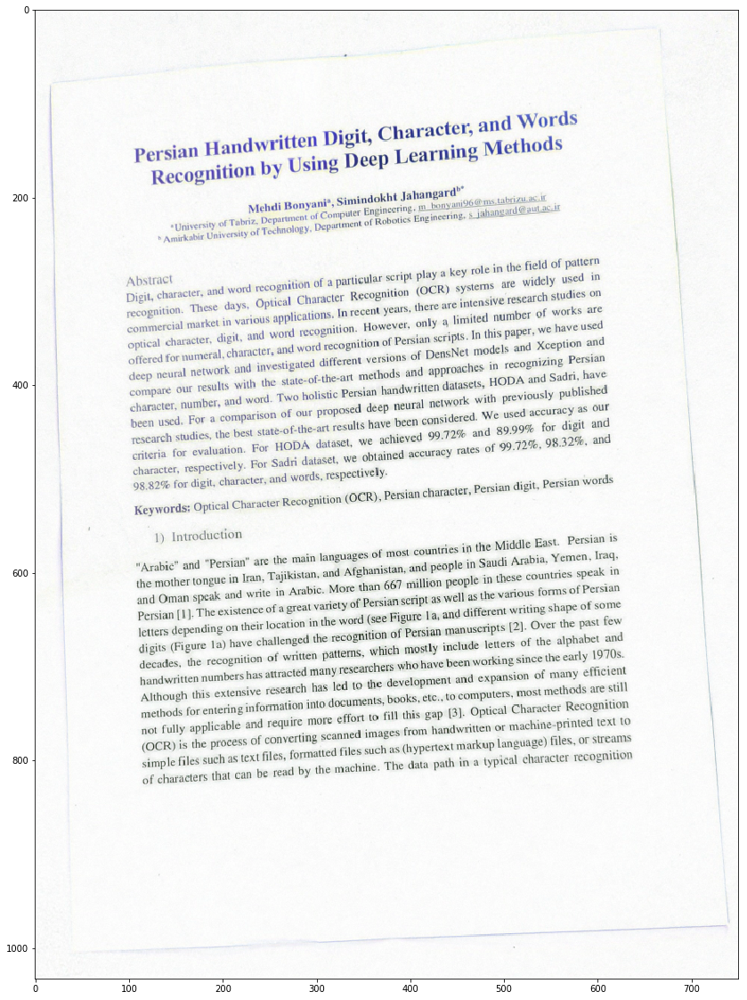

(<matplotlib.image.AxesImage at 0x194b1ef28>, None)

In [524]:
plt.imshow(im_out),plt.show()

In [502]:
im_out_gray = cv2.cvtColor(im_out, cv2.COLOR_BGR2GRAY)
kernel = np.ones((4,4),np.uint8)
morphology = cv2.morphologyEx(im_out_gray, cv2.MORPH_OPEN, kernel)

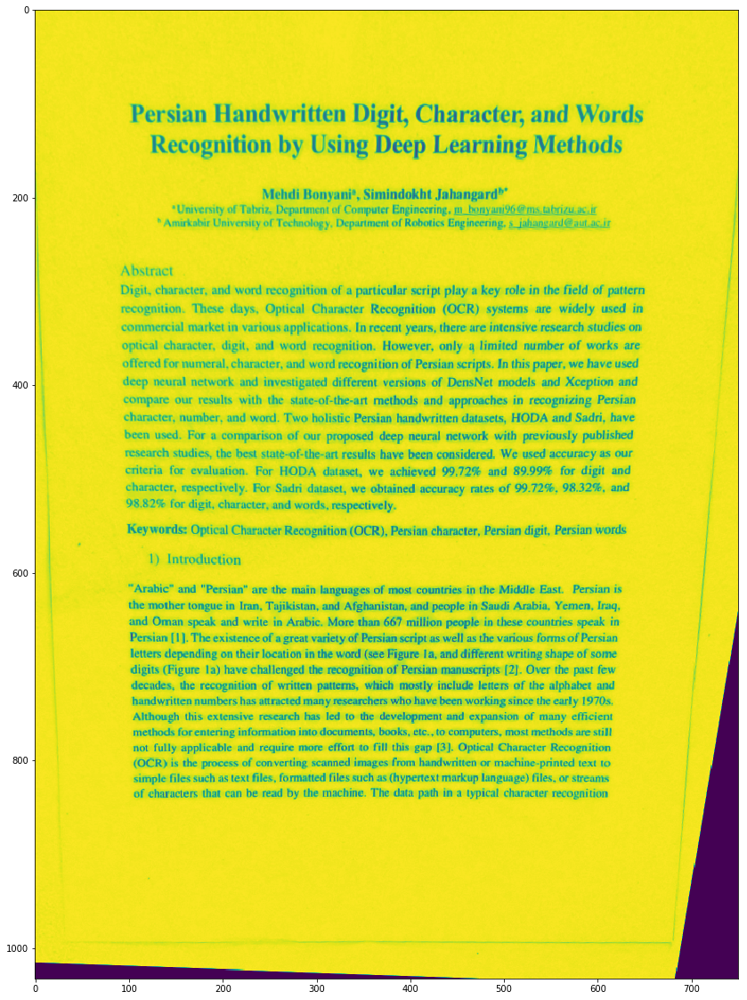

In [503]:
plt.imshow(im_out_gray)

In [504]:
def detect_lines(img):
    """
    Returns lines in a text image, uses opencv to first apply a morphology then findContours to detect the contours of a text.
    Uses the following algorithm for contour detection : 
    Suzuki, S. and Abe, K., Topological Structural Analysis of Digitized Binary Images by Border Following. CVGIP 30 1, pp 32-46 (1985)
    """
    # convert to gray
    if len(img.shape) == 3:
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    else : 
        gray = img.copy()
    # threshold the grayscale image
    
    thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]

    # use morphology erode to blur horizontally
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (151, 3))
    morph = cv2.morphologyEx(thresh, cv2.MORPH_DILATE, kernel)
    
    # find contours
    cntrs = cv2.findContours(morph, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cntrs = cntrs[0] if len(cntrs) == 2 else cntrs[1]

    # find the topmost box
    ythresh = 1000000
    for c in cntrs:
        box = cv2.boundingRect(c)
        x,y,w,h = box
        if y < ythresh:
            topbox = box
            ythresh = y

    # Draw contours excluding the topmost box
    result = img.copy()
    for c in cntrs:
        box = cv2.boundingRect(c)
        if box != topbox:
            x,y,w,h = box
            cv2.rectangle(result, (x, y), (x+w, y+h), (0, 0, 255), 2)
    return cntrs,result,morph,thresh

In [511]:
cntrs,result,morph,thresh = detect_lines(im_out_gray)

Text(0.5, 1.0, 'thresh image')

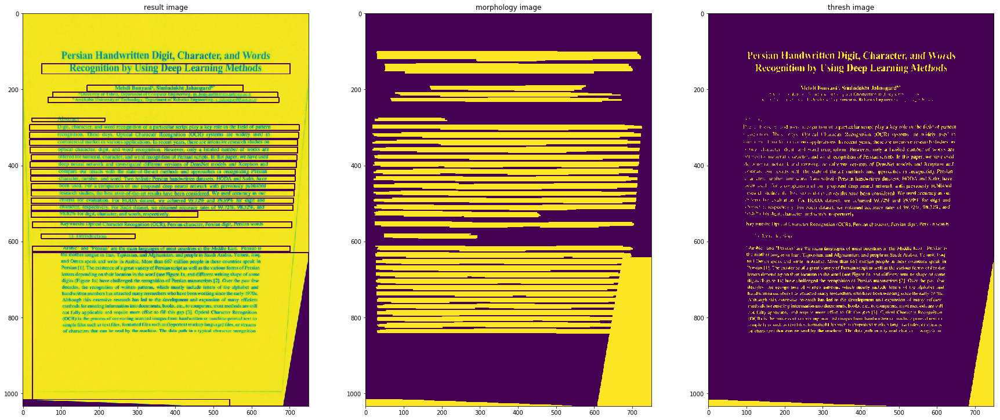

In [512]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3)
plt.rcParams["figure.figsize"] = [30,20]

ax1.imshow(result)
ax1.set_title('result image')

ax2.imshow(morph)
ax2.set_title('morphology image')


ax3.imshow(thresh)
ax3.set_title('thresh image')

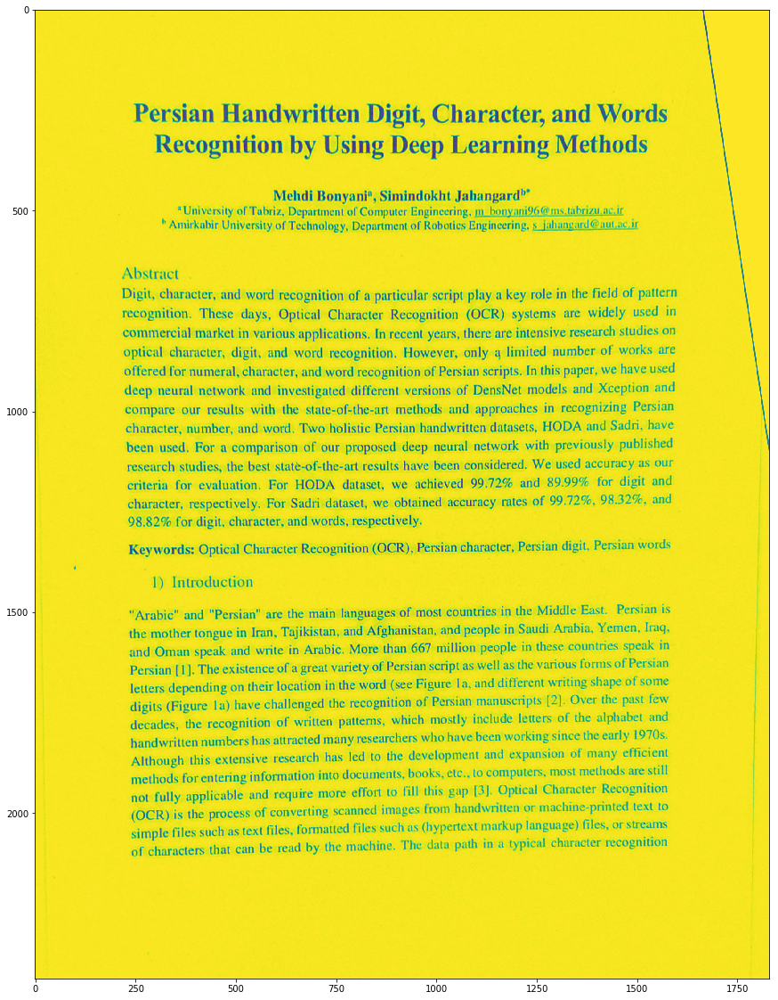

In [455]:
plt.imshow(im_out_gray)

In [456]:
import pytesseract

import cv2
#img = cv2.imread('after_img.jpg')
im_tesseract = im_out_gray.copy()
d = pytesseract.image_to_data(im_tesseract, output_type=pytesseract.Output.DICT)
n_boxes = len(d['level'])
for i in range(n_boxes):
    (x, y, w, h) = (d['left'][i], d['top'][i], d['width'][i], d['height'][i])
    cv2.rectangle(im_tesseract, (x, y), (x + w, y + h), (0, 255, 0), 2)


TesseractNotFoundError: C:\Program Files\Tesseract-OCR\tesseract is not installed or it's not in your PATH. See README file for more information.

In [ ]:
plt.imshow(im_tesseract)

In [437]:
import pytesseract
pytesseract.pytesseract.tesseract_cmd = r'C:\Program Files\Tesseract-OCR\tesseract'
print(pytesseract.image_to_string('after_img.jpg'))

TesseractNotFoundError: C:\Program Files\Tesseract-OCR\tesseract is not installed or it's not in your PATH. See README file for more information.